
# Assignment 3

This is a template notebook for Assignment 3.


## Install dependencies and initialization

In [ ]:
# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

In [1]:
!pwd # shows current directory
!ls  # shows all files in this directory
!nvidia-smi # shows the specs and the current status of the allocated GPU

/content
'=2.0.1'   drive   sample_data
Tue Nov  3 20:11:42 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.32.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                

In [2]:
# import some common libraries
from google.colab.patches import cv2_imshow
from sklearn.metrics import jaccard_score
from PIL import Image, ImageDraw
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np
import datetime
import random
import json
import cv2
import csv
import os

# import some common pytorch utilities
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torch.autograd import Variable
import torch.nn.functional as F
import torch.nn as nn
import torch

# import some common detectron2 utilities
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.structures import BoxMode
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.utils.logger import setup_logger
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import Visualizer
from detectron2.data import build_detection_test_loader
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
setup_logger()

<Logger detectron2 (DEBUG)>

In [3]:
# Make sure that GPU is available for your notebook. 
# Otherwise, you need to update the settungs in Runtime -> Change runtime type -> Hardware accelerator
torch.cuda.is_available()

True

In [4]:
# You need to mount your google drive in order to load the data:
from google.colab import drive
drive.mount('/content/drive')
# Put all the corresponding data files in a data folder and put the data folder in a same directory with this notebook.
# Also create an output directory for your files such as the trained models and the output images.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
# Define the location of current directory, which should contain data/train, data/test, and data/train.json.
# TODO: approx 1 line

BASE_DIR = '/content/drive/My Drive/CMPT_CV_lab3'
OUTPUT_DIR = '{}/output'.format(BASE_DIR)
os.makedirs(OUTPUT_DIR, exist_ok=True)

## Part 1: Object Detection

### Data Loader

In [6]:
'''
# This function should return a list of data samples in which each sample is a dictionary. 
# Make sure to select the correct bbox_mode for the data
# For the test data, you only have access to the images, therefore, the annotations should be empty.
# Other values could be obtained from the image files.
# TODO: approx 35 lines
'''

def get_detection_data(set_name):
  data_dirs = '{}/data'.format(BASE_DIR)
  dataset = []

  if set_name == "train":
    json_file = os.path.join(data_dirs, "train.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    for i in imgs_anns:
      objs = {
        "bbox": i["bbox"],
        "bbox_mode": BoxMode.XYWH_ABS,
        "segmentation": i["segmentation"],
        "category_id": 0}

      index = -1
      for j, dic in enumerate(dataset):
        if dic["image_id"] == i["image_id"]:
          index = j
          break
      
      if (index == -1):
        record = {}

        filename = os.path.join(data_dirs, set_name, i["file_name"])
        width, height = Image.open(filename).size

        record["file_name"] = filename
        record["image_id"] = i["image_id"]
        record["height"] = height
        record["width"] = width
        record["annotations"] = [objs]

        dataset.append(record)
      else:
        dataset[index]["annotations"].append(objs)

  if set_name == "test":
    id = 0
    for i in os.listdir(os.path.join(data_dirs, set_name)):
      filename = os.path.join(data_dirs, set_name, i)
      width, height = Image.open(filename).size
      record = {}
      record["file_name"] = filename
      record["image_id"] = id
      id += 1
      record["height"] = height
      record["width"] = width
      record["annotations"] = [{
          "bbox": [],
          "bbox_mode": BoxMode.XYWH_ABS,
          "segmentation": [[]],
          "category_id": 0}]
      dataset.append(record)

  return dataset

In [7]:
'''
# Remember to add your dataset to DatasetCatalog and MetadataCatalog
# Consdier "data_detection_train" and "data_detection_test" for registration
# You can also add an optional "data_detection_val" for your validation by spliting the training data
# TODO: approx 5 lines
'''

for d in ["train", "test"]:
    DatasetCatalog.register("data_detection_" + d, lambda d=d: get_detection_data(d))
    MetadataCatalog.get("data_detection_" + d).set(thing_classes=["plane"])
data_detection_metadata = MetadataCatalog.get("data_detection_train")

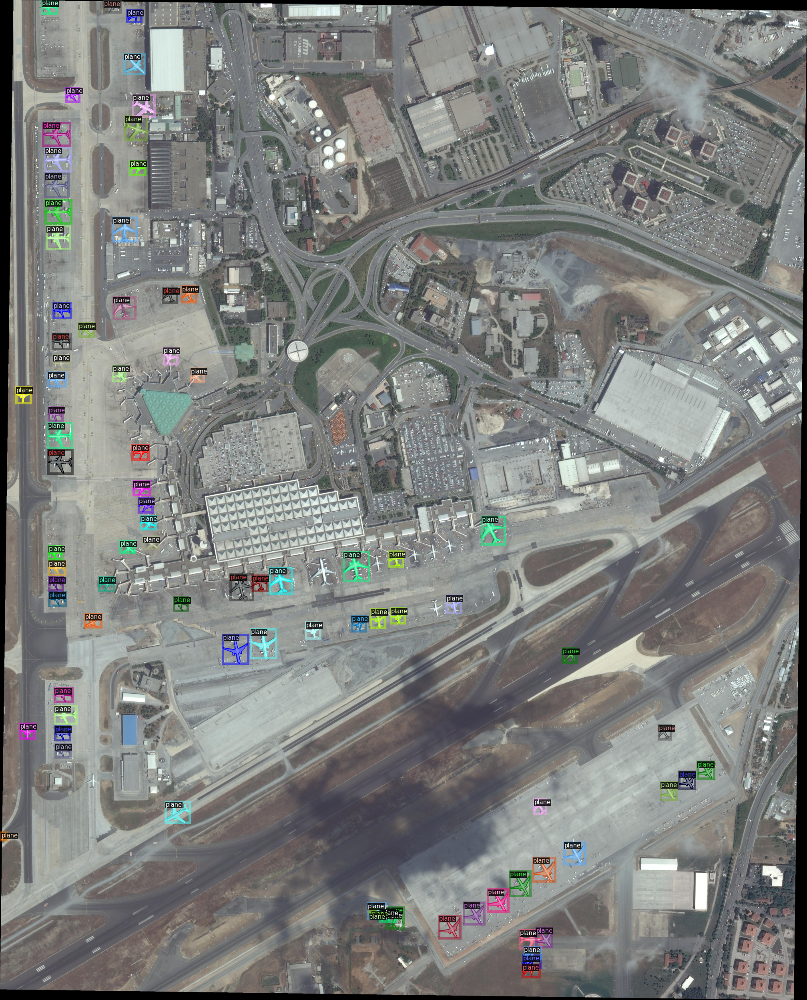

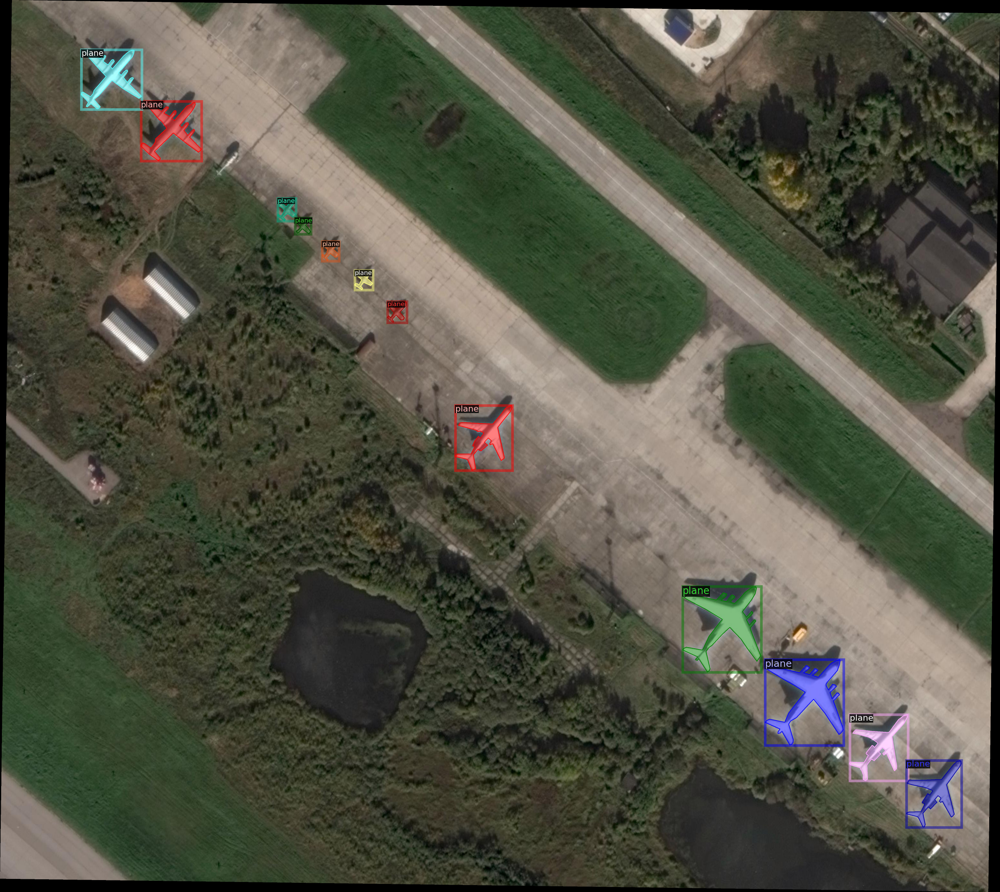

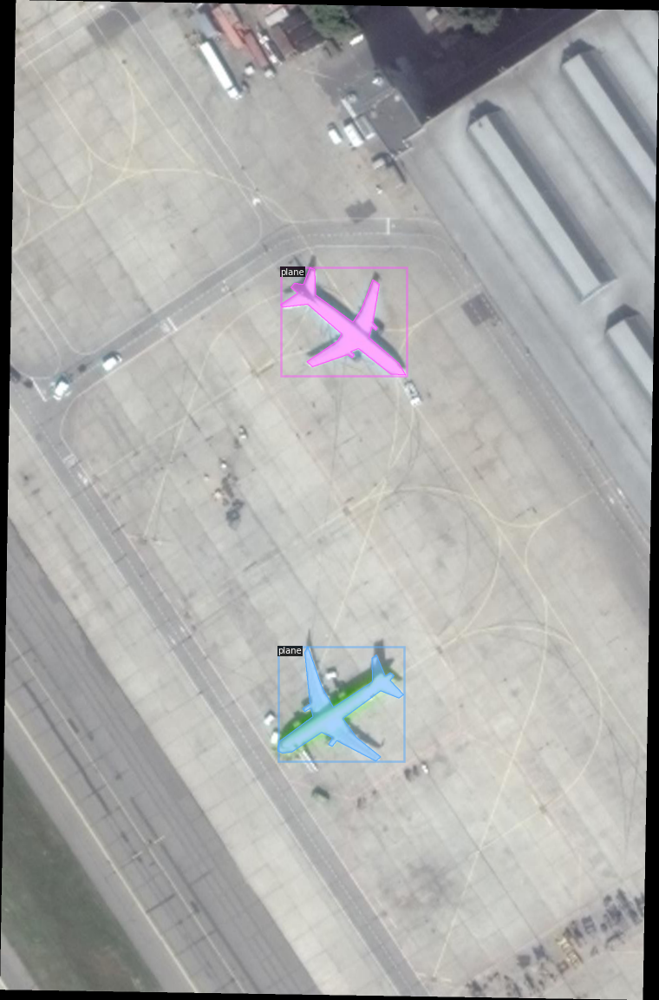

In [ ]:
'''
# Visualize some samples using Visualizer to make sure that the function works correctly
# TODO: approx 5 lines
'''

dataset_dicts = get_detection_data("train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=data_detection_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

### Set Configs

In [8]:
'''
# Set the configs for the detection part in here.
# TODO: approx 15 lines
'''
cfg = get_cfg()
cfg.OUTPUT_DIR = "{}/output/".format(BASE_DIR)

cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("data_detection_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

### Training

In [ ]:
'''
# Create a DefaultTrainer using the above config and train the model
# TODO: approx 5 lines
'''
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[11/01 22:00:21 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f6e8b1.pkl: 243MB [00:15, 15.5MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.


[11/01 22:00:49 d2.engine.train_loop]: Starting training from iteration 0
[11/01 22:01:11 d2.utils.events]:  eta: 0:15:27  iter: 19  total_loss: 2.828  loss_cls: 0.748  loss_box_reg: 0.330  loss_rpn_cls: 1.226  loss_rpn_loc: 0.308  time: 1.1114  data_time: 0.7577  lr: 0.000005  max_mem: 13750M
[11/01 22:01:31 d2.utils.events]:  eta: 0:12:47  iter: 39  total_loss: 2.672  loss_cls: 0.700  loss_box_reg: 0.187  loss_rpn_cls: 1.272  loss_rpn_loc: 0.629  time: 1.0536  data_time: 0.6416  lr: 0.000010  max_mem: 13750M
[11/01 22:01:52 d2.utils.events]:  eta: 0:13:42  iter: 59  total_loss: 1.678  loss_cls: 0.588  loss_box_reg: 0.238  loss_rpn_cls: 0.348  loss_rpn_loc: 0.430  time: 1.0591  data_time: 0.7190  lr: 0.000015  max_mem: 13750M
[11/01 22:02:12 d2.utils.events]:  eta: 0:12:59  iter: 79  total_loss: 1.465  loss_cls: 0.490  loss_box_reg: 0.355  loss_rpn_cls: 0.279  loss_rpn_loc: 0.292  time: 1.0337  data_time: 0.6506  lr: 0.000020  max_mem: 13750M
[11/01 22:02:28 d2.utils.events]:  eta: 0:

### Evaluation and Visualization

In [9]:
'''
# After training the model, you need to update cfg.MODEL.WEIGHTS
# Define a DefaultPredictor
'''

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6
predictor = DefaultPredictor(cfg)

In [ ]:
'''
# Visualize the output for 3 random test samples
# TODO: approx 10 lines
'''

from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_detection_data("test")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=data_detection_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
'''
# Use COCOEvaluator and build_detection_train_loader
# You can save the output predictions using inference_on_dataset
# TODO: approx 5 lines
'''

evaluator = COCOEvaluator("data_detection_train", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "data_detection_train")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

[11/01 22:20:02 d2.data.common]: Serializing 198 elements to byte tensors and concatenating them all ...
[11/01 22:20:02 d2.data.common]: Serialized dataset takes 15.40 MiB
[11/01 22:20:02 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/01 22:20:02 d2.evaluation.evaluator]: Start inference on 198 images
[11/01 22:20:08 d2.evaluation.evaluator]: Inference done 11/198. 0.0860 s / img. ETA=0:01:04
[11/01 22:20:13 d2.evaluation.evaluator]: Inference done 38/198. 0.0880 s / img. ETA=0:00:34
[11/01 22:20:21 d2.evaluation.evaluator]: Inference done 61/198. 0.0866 s / img. ETA=0:00:37
[11/01 22:20:28 d2.evaluation.evaluator]: Inference done 72/198. 0.0865 s / img. ETA=0:00:40
[11/01 22:20:33 d2.evaluation.evaluator]: Inference done 81/198. 0.0867 s / img. ETA=0:00:41
[11/01 22:20:40 d2.evaluation.evaluator]: Inference done 89/198. 0.0860 s / img. ETA=0:00:44
[11/01 22:20:46 d2.evaluation.evalu

### Improvements

For this part, you can bring any improvement which you have by adding new input parameters to the previous functions or defining new functions and variables.

In [ ]:
'''
# Bring any changes and updates regarding the improvement in here
'''


## Part 2: Semantic Segmentation

### Data Loader

In [10]:
'''
# Write a function that returns the cropped image and corresponding mask regarding the target bounding box
# idx is the index of the target bbox in the data
# high-resolution image could be passed or could be load from data['file_name']
# You can use detectron2.utils.visualizer.GenericMask to convert the segmentation annotations to binary masks
# TODO: approx 10 lines
'''

def get_instance_sample(data, idx, img=None):
  size = (128, 128)
  im = cv2.imread(data['file_name'])
  x = int(data['annotations'][idx]['bbox'][0])
  y = int(data['annotations'][idx]['bbox'][1])
  w = int(data['annotations'][idx]['bbox'][2])
  h = int(data['annotations'][idx]['bbox'][3])
  obj_img = cv2.resize(im[y: y+h, x: x+w], size)

  mask = detectron2.utils.visualizer.GenericMask(data['annotations'][idx]['segmentation'], data['height'], data['width']).mask
  mask = cv2.resize(mask[y: y+h, x: x+w], size)
  obj_mask = np.array(mask*255).astype('uint8')

  return obj_img, obj_mask

In [11]:
'''
# We have provided a template data loader for your segmentation training
# You need to complete the __getitem__() function before running the code
# You may also need to add data augmentation or normalization in here
'''

class PlaneDataset(Dataset):
  def __init__(self, set_name, data_list):
      self.transforms = transforms.Compose([
          transforms.ToTensor(), # Converting the image to tensor and change the image format (Channels-Last => Channels-First)
      ])
      self.set_name = set_name
      self.data = data_list
      self.instance_map = []
      for i, d in enumerate(self.data):
        for j in range(len(d['annotations'])):
          self.instance_map.append([i,j])

  '''
  # you can change the value of length to a small number like 10 for debugging of your training procedure and overfeating
  # make sure to use the correct length for the final training
  '''
  def __len__(self):
      return len(self.instance_map)

  def numpy_to_tensor(self, img, mask):
    if self.transforms is not None:
        img = self.transforms(img)
    img = torch.tensor(img, dtype=torch.float)
    mask = torch.tensor(mask, dtype=torch.float)
    return img, mask

  '''
  # Complete this part by using get_instance_sample function
  # make sure to resize the img and mask to a fixed size (for example 128*128)
  # you can use "interpolate" function of pytorch or "numpy.resize"
  # TODO: 5 lines
  '''
  def __getitem__(self, idx):
    if torch.is_tensor(idx):
        idx = idx.tolist()
    idx = self.instance_map[idx]
    data = self.data[idx[0]]

    img, mask = get_instance_sample(data, idx[1], img=None)
    img = self.transforms(img)
    mask = self.transforms(mask)

    return img, mask

def get_plane_dataset(set_name='train', batch_size=2):
    my_data_list = DatasetCatalog.get("data_detection_{}".format(set_name))
    dataset = PlaneDataset(set_name, my_data_list)
    loader = DataLoader(dataset, batch_size=batch_size, num_workers=4,
                                              pin_memory=True, shuffle=True)
    return loader, dataset

### Network

In [12]:
'''
# convolution module as a template layer consists of conv2d layer, batch normalization, and relu activation
'''
class conv(nn.Module):
    def __init__(self, in_ch, out_ch, activation=True):
        super(conv, self).__init__()
        if(activation):
          self.layer = nn.Sequential(
             nn.Conv2d(in_ch, out_ch, 3, padding=1),
             nn.BatchNorm2d(out_ch),
             nn.ReLU(inplace=True)
          )
        else:
          self.layer = nn.Sequential(
             nn.Conv2d(in_ch, out_ch, 3, padding=1)  
             )

    def forward(self, x):
        x = self.layer(x)
        return x

'''
# downsampling module equal to a conv module followed by a max-pool layer
'''
class down(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(down, self).__init__()
        self.layer = nn.Sequential(
            conv(in_ch, out_ch),
            nn.MaxPool2d(2)
            )

    def forward(self, x):
        x = self.layer(x)
        return x

'''
# upsampling module equal to a upsample function followed by a conv module
'''
class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=False):
        super(up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch, in_ch, 2, stride=2)

        self.conv = conv(in_ch, out_ch)

    def forward(self, x):
        y = self.up(x)
        y = self.conv(y)
        return y

'''
# the main model which you need to complete by using above modules.
# you can also modify the above modules in order to improve your results.
'''
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        
        # Encoder
        
        self.input_conv = conv(3, 4)
        self.down = down(4, 8)
        
        # Decoder
        
        self.up = up(8, 4)
        self.output_conv = conv(4, 1, False) # ReLu activation is removed to keep the logits for the loss function
        

    def forward(self, input):
      y = self.input_conv(input)
      y = self.down(y)
      y = self.up(y)
      output = self.output_conv(y)
      return output

### Training

In [128]:
'''
# The following is a basic training procedure to train the network
# You need to update the code to get the best performance
# TODO: approx ? lines
'''

# Set the hyperparameters
num_epochs = 5
batch_size = 4
learning_rate = 0.005
weight_decay = 1e-5

model = MyModel() # initialize the model
model = model.cuda() # move the model to GPU
loader, _ = get_plane_dataset('train', batch_size) # initialize data_loader
crit = nn.BCEWithLogitsLoss() # Define the loss function
optim = torch.optim.SGD(model.parameters(), lr=learning_rate, weight_decay=weight_decay) # Initialize the optimizer as SGD

# start the training procedure
for epoch in range(num_epochs):
  total_loss = 0
  for (img, mask) in tqdm(loader):
    img = torch.tensor(img, device=torch.device('cuda'), requires_grad = True)
    mask = torch.tensor(mask, device=torch.device('cuda'), requires_grad = True)
    pred = model(img)
    loss = crit(pred, mask)
    optim.zero_grad()
    loss.backward()
    optim.step()
    total_loss += loss.cpu().data
  print("Epoch: {}, Loss: {}".format(epoch, total_loss/len(loader)))
  torch.save(model.state_dict(), '{}/output/{}_segmentation_model.pth'.format(BASE_DIR, epoch))

'''
# Saving the final model
'''
torch.save(model.state_dict(), '{}/output/final_segmentation_model.pth'.format(BASE_DIR))


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



Epoch: 0, Loss: 0.3812272846698761



Epoch: 1, Loss: 0.3213743269443512



Epoch: 2, Loss: 0.31292349100112915



Epoch: 3, Loss: 0.30849841237068176



Epoch: 4, Loss: 0.30641692876815796


### Evaluation and Visualization

In [176]:
'''
# Before starting the evaluation, you need to set the model mode to eval
# You may load the trained model again, in case if you want to continue your code later
# TODO: approx 15 lines
'''
batch_size = 8
model = MyModel().cuda()
model.load_state_dict(torch.load('{}/output/final_segmentation_model.pth'.format(BASE_DIR)))
model = model.eval() # chaning the model to evaluation mode will fix the bachnorm layers
loader, dataset = get_plane_dataset('train', batch_size)


total_iou = 0
for (img, mask) in tqdm(loader):
  with torch.no_grad():
    img = img.cuda()
    mask = mask.cuda()
    mask = torch.unsqueeze(mask,1)
    pred = model(img)

    '''
    ## Complete the code by obtaining the IoU for each img and print the final Mean IoU
    '''
    mask = mask.cpu().numpy()[0][0][0]
    pred = pred.cpu().numpy()[0][0]

    pred[pred < 0] = 0
    pred[pred > 0] = 255

    intersection = np.logical_and(mask, pred)
    union = np.logical_or(mask, pred)
    total_iou += np.sum(intersection) / np.sum(union)

print("\n #images: {}, Mean IoU: {}".format(len(loader), total_iou/len(loader)))



 #images: 998, Mean IoU: 0.6268263284199577


In [ ]:
'''
# Visualize 3 sample outputs
# TODO: approx 5 lines
'''
'{}/data/crop'.format(BASE_DIR)

model = MyModel().cuda()
model.load_state_dict(torch.load('{}/output/final_segmentation_model.pth'.format(BASE_DIR)))
model = model.eval()
for i in os.listdir('{}/data/crop'.format(BASE_DIR)):
  filename = os.path.join('{}/data/crop'.format(BASE_DIR), i)
  img = cv2.imread(filename)
  img = cv2.resize(img, (128, 128))
  cv2_imshow(img)

  img = transforms.ToTensor()(img)
  img = torch.unsqueeze(img, 0)
  pred = model(img.cuda())
  pred = pred.detach().cpu().numpy()[0][0]

  pred[pred < 0] = 0
  pred[pred > 0] = 255

  cv2_imshow(pred)

## Part 3: Instance Segmentation

In this part, you need to obtain the instance segmentation results for the test data by using the trained segmentation model in the previous part and the detection model in Part 1.

### Get Prediction

In [165]:
'''
# Define a new function to obtain the prediction mask by passing a sample data
# For this part, you need to use all the previous parts (predictor, get_instance_sample, data preprocessings, etc)
# TODO: approx 35 lines
'''

def get_prediction_mask(data):
  with torch.no_grad():
    img = cv2.imread(data['file_name'])
    gt_mask = np.zeros((data['height'], data['width']))
    
    if data['annotations'][0]['bbox'] != []:
      for i in range(len(data['annotations'])):
        mask = detectron2.utils.visualizer.GenericMask(data['annotations'][i]['segmentation'], data['height'], data['width']).mask
        x = int(data['annotations'][i]['bbox'][0])
        y = int(data['annotations'][i]['bbox'][1])
        w = int(data['annotations'][i]['bbox'][2])
        h = int(data['annotations'][i]['bbox'][3])
        mask = mask[y: y+h, x: x+w]
        mask = np.array(mask*255).astype('uint8')
        mask = np.array(mask*(i+1))
        gt_mask[y: y+h, x: x+w] = mask


    pred_inst = predictor(img)['instances']
    pred_mask = np.zeros((data['height'], data['width']))
    for i in range(len(pred_inst)):
      pred_bbox= (pred_inst[i].pred_boxes.tensor[0].cpu().numpy())
      x1 = int(pred_bbox[0])
      y1 = int(pred_bbox[1])
      x2 = int(pred_bbox[2])
      y2 = int(pred_bbox[3])
      image = img[y1:y2, x1:x2]
      image = transforms.ToTensor()(image)
      image = torch.unsqueeze(image, 0)
      pred = model(image.cuda())
      pred = pred.detach().cpu().numpy()[0][0]

      pred[pred < 0] = 0
      pred[pred > 0] = 255

      pred = np.array(pred*(i+1))
      pred_mask[y1:y1+pred.shape[0], x1:x1+pred.shape[1]] = pred

    img = transforms.ToTensor()(img)
    gt_mask = transforms.ToTensor()(gt_mask).cuda()
    pred_mask = transforms.ToTensor()(pred_mask).cuda()
    
  return img, gt_mask, pred_mask

### Visualization and Submission

In [ ]:
'''
# Visualise the output prediction as well as the GT Mask and Input image for a sample input
# TODO: approx 10 lines
'''
for i in range(3):
  img, gt_mask, pred_mask = get_prediction_mask(get_detection_data("test")[i])

  img = img.detach().cpu().numpy()[0]
  img = np.array(img*255).astype('uint8')
  #gt_mask = gt_mask.detach().cpu().numpy()[0]
  #gt_mask = np.array(gt_mask*255).astype('uint8')
  pred_mask = pred_mask.detach().cpu().numpy()[0]
  pred_mask = np.array(pred_mask).astype('uint8')

  height, width = img.shape[:2]
  size = (int(width*0.2), int(height*0.2))
  img = cv2.resize(img, size)
  #gt_mask = cv2.resize(gt_mask, size)
  pred_mask = cv2.resize(pred_mask, size)
  cv2_imshow(img)
  print('')
  #cv2_imshow(gt_mask)
  #print('')
  cv2_imshow(pred_mask)
  print('')

In [167]:
'''
# ref: https://www.kaggle.com/rakhlin/fast-run-length-encoding-python
# https://www.kaggle.com/c/airbus-ship-detection/overview/evaluation
'''
def rle_encoding(x):
    '''
    x: numpy array, 1 - mask, 0 - background
    Returns run length as list
    '''
    dots = torch.where(torch.flatten(x.long())==1)[0]
    if(len(dots)==0):
      return []
    inds = torch.where(dots[1:]!=dots[:-1]+1)[0]+1
    inds = torch.cat((torch.tensor([0], device=torch.device('cuda'), dtype=torch.long), inds))
    tmpdots = dots[inds]
    inds = torch.cat((inds, torch.tensor([len(dots)], device=torch.device('cuda'))))
    inds = inds[1:] - inds[:-1]
    runs = torch.cat((tmpdots, inds)).reshape((2,-1))
    runs = torch.flatten(torch.transpose(runs, 0, 1)).cpu().data.numpy()
    return ' '.join([str(i) for i in runs])

In [168]:
'''
# You need to upload the csv file on kaggle
# The speed of your code in the previous parts highly affects the running time of this part
'''

preddic = {"ImageId": [], "EncodedPixels": []}

'''
# Writing the predictions of the training set
'''
my_data_list = DatasetCatalog.get("data_detection_{}".format('train'))
for i in tqdm(range(len(my_data_list)), position=0, leave=True):
  sample = my_data_list[i]
  sample['image_id'] = sample['file_name'].split("/")[-1][:-4]
  img, true_mask, pred_mask = get_prediction_mask(sample)
  inds = torch.unique(pred_mask)
  if(len(inds)==1):
    preddic['ImageId'].append(sample['image_id'])
    preddic['EncodedPixels'].append([])
  else:
    for index in inds:
      if(index == 0):
        continue
      tmp_mask = (pred_mask==index)
      encPix = rle_encoding(tmp_mask)
      preddic['ImageId'].append(sample['image_id'])
      preddic['EncodedPixels'].append(encPix)

'''
# Writing the predictions of the test set
'''

my_data_list = DatasetCatalog.get("data_detection_{}".format('test'))
for i in tqdm(range(len(my_data_list)), position=0, leave=True):
  sample = my_data_list[i]
  sample['image_id'] = sample['file_name'].split("/")[-1][:-4]
  img, true_mask, pred_mask = get_prediction_mask(sample)
  inds = torch.unique(pred_mask)
  if(len(inds)==1):
    preddic['ImageId'].append(sample['image_id'])
    preddic['EncodedPixels'].append([])
  else:
    for j, index in enumerate(inds):
      if(index == 0):
        continue
      tmp_mask = (pred_mask==index).double()
      encPix = rle_encoding(tmp_mask)
      preddic['ImageId'].append(sample['image_id'])
      preddic['EncodedPixels'].append(encPix)

pred_file = open("{}/pred.csv".format(BASE_DIR), 'w')
pd.DataFrame(preddic).to_csv(pred_file, index=False)
pred_file.close()


## Part 4: Mask R-CNN

For this part you need to follow a same procedure to part 2 with the configs of Mask R-CNN, other parts are generally the same as part 2.

### Data Loader

In [154]:
def get_detection_data(set_name):
  data_dirs = '{}/data'.format(BASE_DIR)
  dataset = []

  if set_name == "train":
    json_file = os.path.join(data_dirs, "train.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    for i in imgs_anns:
      objs = {
        "bbox": i["bbox"],
        "bbox_mode": BoxMode.XYWH_ABS,
        "segmentation": i["segmentation"],
        "category_id": 0}

      index = -1
      for j, dic in enumerate(dataset):
        if dic["image_id"] == i["image_id"]:
          index = j
          break
      
      if (index == -1):
        record = {}

        filename = os.path.join(data_dirs, set_name, i["file_name"])
        width, height = Image.open(filename).size

        record["file_name"] = filename
        record["image_id"] = i["image_id"]
        record["height"] = height
        record["width"] = width
        record["annotations"] = [objs]

        dataset.append(record)
      else:
        dataset[index]["annotations"].append(objs)

  if set_name == "test":
    id = 0
    for i in os.listdir(os.path.join(data_dirs, set_name)):
      filename = os.path.join(data_dirs, set_name, i)
      width, height = Image.open(filename).size
      record = {}
      record["file_name"] = filename
      record["image_id"] = id
      id += 1
      record["height"] = height
      record["width"] = width
      record["annotations"] = [{
          "bbox": [],
          "bbox_mode": BoxMode.XYWH_ABS,
          "segmentation": [[]],
          "category_id": 0}]
      dataset.append(record)

  return dataset

### Network

In [156]:
data_detection_metadata = MetadataCatalog.get("data_detection_train")

cfg = get_cfg()
cfg.OUTPUT_DIR = "{}/part4_output/".format(BASE_DIR)

cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("data_detection_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

### Training

In [157]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[11/03 07:53:40 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:17, 10.1MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to i

[11/03 07:54:29 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:331: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:331: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_

[11/03 07:54:49 d2.utils.events]:  eta: 0:08:54  iter: 19  total_loss: 3.178  loss_cls: 0.660  loss_box_reg: 0.229  loss_mask: 0.694  loss_rpn_cls: 1.313  loss_rpn_loc: 0.300  time: 0.8594  data_time: 0.7882  lr: 0.000005  max_mem: 2845M
[11/03 07:55:09 d2.utils.events]:  eta: 0:08:44  iter: 39  total_loss: 2.449  loss_cls: 0.612  loss_box_reg: 0.318  loss_mask: 0.689  loss_rpn_cls: 0.453  loss_rpn_loc: 0.276  time: 0.9319  data_time: 0.7960  lr: 0.000010  max_mem: 4793M
[11/03 07:55:32 d2.utils.events]:  eta: 0:11:27  iter: 59  total_loss: 2.650  loss_cls: 0.545  loss_box_reg: 0.355  loss_mask: 0.682  loss_rpn_cls: 0.642  loss_rpn_loc: 0.393  time: 0.9952  data_time: 0.9286  lr: 0.000015  max_mem: 4793M
[11/03 07:55:48 d2.utils.events]:  eta: 0:11:12  iter: 79  total_loss: 2.241  loss_cls: 0.479  loss_box_reg: 0.312  loss_mask: 0.669  loss_rpn_cls: 0.269  loss_rpn_loc: 0.398  time: 0.9551  data_time: 0.6557  lr: 0.000020  max_mem: 4793M
[11/03 07:56:10 d2.utils.events]:  eta: 0:11:50 

### Evaluation and Visualization

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6
predictor = DefaultPredictor(cfg)

from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_detection_data("test")
#for d in random.sample(dataset_dicts, 3):  
for i in range(3):
  d = dataset_dicts[i]
  im = cv2.imread(d["file_name"])
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                  metadata=data_detection_metadata, 
                  scale=0.5, 
                  instance_mode=ColorMode
  )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])

In [159]:
evaluator = COCOEvaluator("data_detection_train", cfg, False, output_dir="./part4_output/")
val_loader = build_detection_test_loader(cfg, "data_detection_train")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

[11/03 08:11:56 d2.evaluation.coco_evaluation]: 'data_detection_train' is not registered by `register_coco_instances`. Therefore trying to convert it to COCO format ...
[11/03 08:11:56 d2.data.datasets.coco]: Converting annotations of dataset 'data_detection_train' to COCO format ...)
[11/03 08:11:58 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[11/03 08:11:59 d2.data.datasets.coco]: Conversion finished, #images: 198, #annotations: 7980
[11/03 08:11:59 d2.data.datasets.coco]: Caching COCO format annotations at './part4_output/data_detection_train_coco_format.json' ...
[11/03 08:12:05 d2.data.common]: Serializing 198 elements to byte tensors and concatenating them all ...
[11/03 08:12:05 d2.data.common]: Serialized dataset takes 15.40 MiB
[11/03 08:12:05 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/03 08:12:05 d2.evaluation.evaluator]: Start inference on 198 imag